# Master

Master Fig1.

In [3]:
library(ggplot2)
library(patchwork)

In [64]:
DAYS = c("D0", "D2", "D4", "D6", "D8", "D10", "D12", "D14")

## Load Subfigs

In [58]:
# UMAP + stats
daywise_umap = readRDS("./subfigs/20200623_daywise_umap.rds")
daywise_counts = readRDS("./subfigs/20200623_daywise_cell_count.rds")
clusterwise_umap = readRDS("./subfigs/20200623_clusterwise_umap.rds")
clusterwise_counts = readRDS("./subfigs/20200623_clusterwise_cell_count.rds")

day_by_cluster = readRDS("./subfigs/20200623_day_by_cluster_breakdown.rds")
cluster_by_day = readRDS("./subfigs/20200623_cluster_by_day_breakdown.rds")

In [104]:
# FRiP plots
fibroblast_frip = readRDS("./subfigs/20200623_fibroblast_frip.rds")
ipsc_frip = readRDS("./subfigs/20200623_ipsc_frip.rds")

In [344]:
# gene score heatmap
gene_score_heatmap = readRDS("./subfigs/20200624_gene_score_heatmap.rds")

In [152]:
# gene score plots
CDH1_gs = readRDS("./subfigs/20200623_CDH1_gs.rds")
NANOG_gs = readRDS("./subfigs/20200623_NANOG_gs.rds")
OCT4_gs = readRDS("./subfigs/20200623_POU5F1_gs.rds")
COL1A1_gs = readRDS("./subfigs/20200623_COL1A1_gs.rds")

In [ ]:
# broser shots
CDH1 = readRDS("./subfigs/20200623_CDH1.rds")
NANOG = readRDS("./subfigs/20200623_NANOG.rds")
OCT4 = readRDS("./subfigs/20200623_OCT4.rds")
COL1A1 = readRDS("./subfigs/20200623_COL1A1.rds")
# browser_labels = readRDS("./subfigs/20200623_browser_labels.rds")

### Configs

In [179]:
cluster_config = read.table("../configs/cluster.tsv", comment.char = '', header=T, sep='\t')
cluster_config$colour = as.character(cluster_config$colour)
cluster_config$description = as.character(cluster_config$description)

rownames(cluster_config) = cluster_config$cluster
cluster_config

,cluster,colour,description,new_cluster
,<int>,<chr>,<chr>,<int>
1,1,#CCCCCC,Intermediate,12
2,2,#E41A1C,Pre-iPSC,15
3,3,#377EB8,Fibroblast-like,5
4,4,#4DAF4A,Fibroblast-like,3
5,5,#984EA3,Fibroblast,1
6,6,#FF7F00,Fibroblast,2
7,7,#4B644A,Fibroblast-like,4
8,8,#A65628,Doublets,17
9,9,#F781BF,Keratinocyte-like,6


In [259]:
# slight tweak for long name
cluster_config[11, "description"] = "Partially\nreprogrammed"

## Assemble Components

In [270]:
horizontal_spacers <- function(plot, widths=c(0,1,0)) {
    wrap_plots(plot_spacer(), plot, plot_spacer(), widths=widths)
}

vertical_spacers <- function(plot, heights=c(0,1,0)) {
    wrap_plots(plot_spacer(), plot, plot_spacer(), ncol=1, heights=heights)
}

### UMAPs

In [22]:
cell_counts_stacked = wrap_plots(list(daywise_counts, clusterwise_counts), ncol=1, heights=c(1,2))

In [51]:
umaps_combined = wrap_plots(plot_spacer(),
             daywise_umap + theme(plot.margin = unit(c(0,0,0,0), "pt")), 
           plot_spacer(),
           clusterwise_umap + theme(plot.margin = unit(c(0,0,0,0), "pt")), 
           cell_counts_stacked,
           plot_spacer(),
           widths=c(5,10,0.5,10,1,0.5))

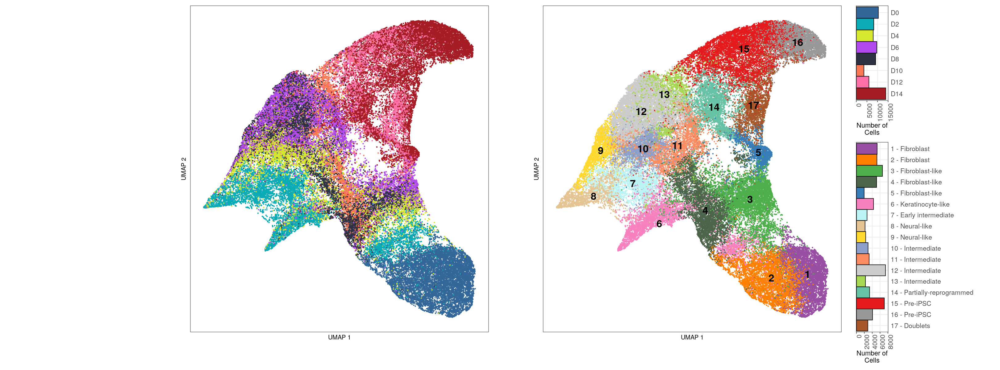

In [93]:
options(repr.plot.width = 27, repr.plot.height = 10)
umaps_combined

### Day x Cluster Breakdown

In [271]:
composition_plot = wrap_plots(day_by_cluster, 
           plot_spacer(), # otherwise "Day overlaps with plot below" 
           cluster_by_day,
           ncol=1,
           heights=c(5,0,5))

# y padding
composition_plot = vertical_spacers(composition_plot,
                       heights=c(1,5,1))

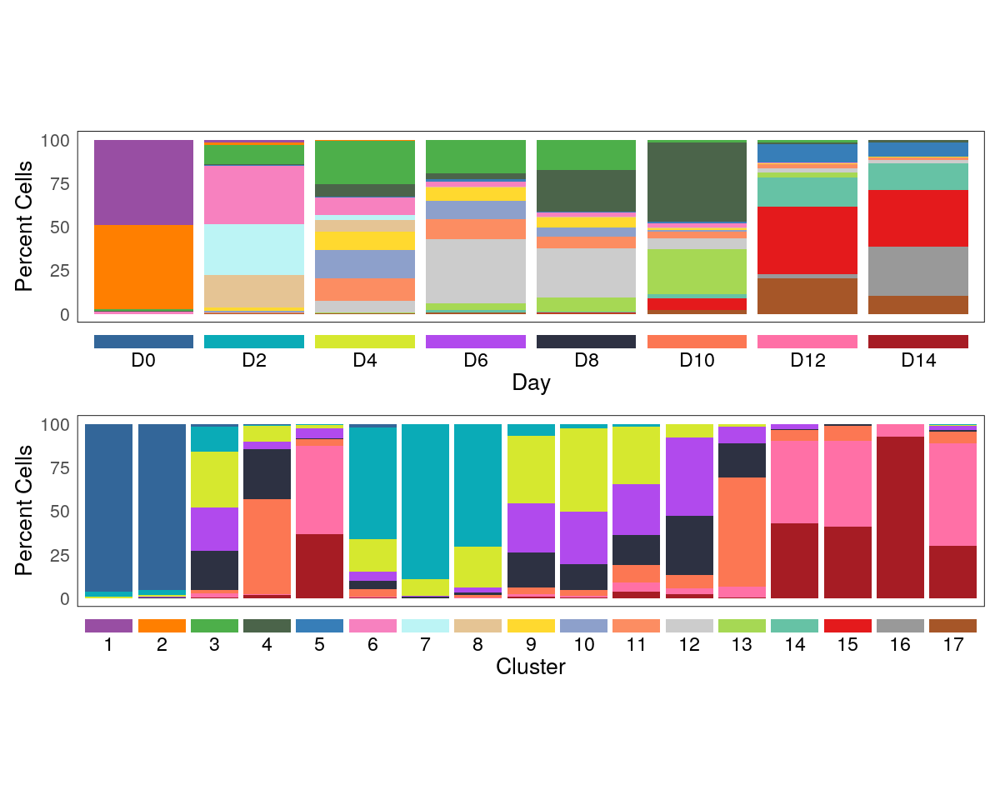

In [272]:
options(repr.plot.width = 10, repr.plot.height = 8)
composition_plot

### FRiP Plot

In [280]:
frip_plots = wrap_plots(fibroblast_frip, 
           plot_spacer(), # otherwise "Day overlaps with plot below" 
           ipsc_frip,
           widths=c(10,0.5,10))

# y padding
frip_plots = vertical_spacers(frip_plots,
                       heights=c(0.5,9,0.5))

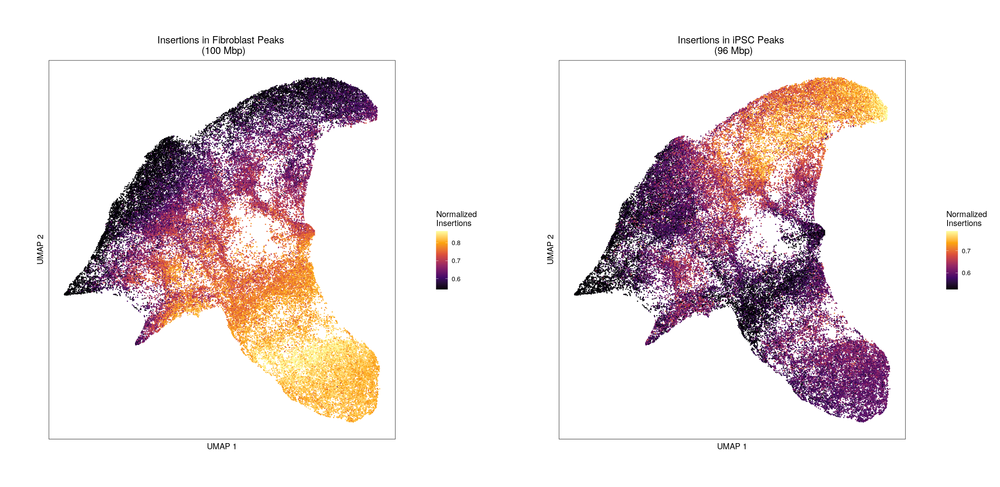

In [281]:
options(repr.plot.width = 20.5, repr.plot.height = 10)
frip_plots

### Row 2

In [123]:
row2_plots = wrap_plots(plot_spacer(),
                        composition_plot,
                        plot_spacer(),
                      frip_plots,
                       plot_spacer(),
                       widths=c(0.5,8,0.5,20.5,0.5))

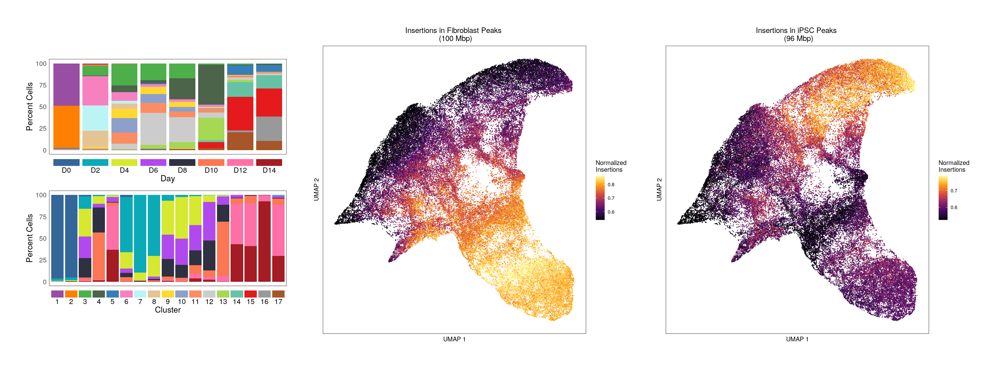

In [124]:
options(repr.plot.width = 27, repr.plot.height = 10)

row2_plots

### Row 2: Option 2

In [365]:
row2_r1 = wrap_plots(horizontal_spacers(day_by_cluster, widths=c(0.2,6.6,0.2)), 
                     horizontal_spacers(cluster_by_day, widths=c(0.2,6.6,0.2)))
row2_r2 = wrap_plots(horizontal_spacers(fibroblast_frip, widths=c(0.5,6.5,0.5)),
                          horizontal_spacers(ipsc_frip, widths=c(0.5,6.5,0.5)))

In [366]:
row2_option2_components = wrap_plots(row2_r1,
                        plot_spacer(),
                        row2_r2,
                        heights=c(1.5,0, 6.5))

In [367]:
row2_option2_plots = wrap_plots(row2_option2_components,
                              vertical_spacers(horizontal_spacers(gene_score_heatmap, widths=c(1,7,1))),
                              widths=c(15,11))

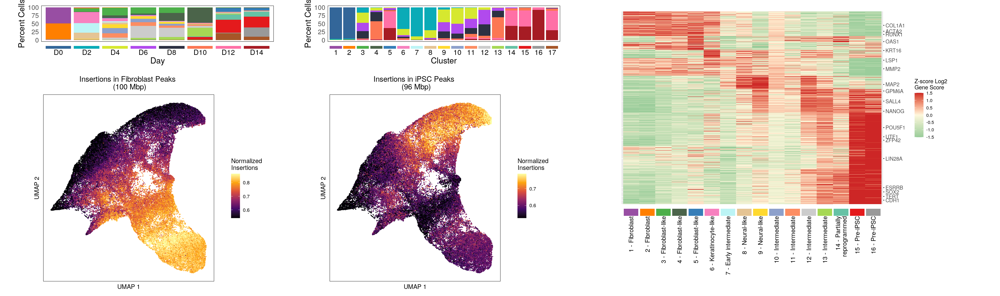

In [368]:
options(repr.plot.width = 27, repr.plot.height = 8)
row2_option2_plots

### Browser Shots with Gene Scores

In [253]:
GS_TO_BROWSER_RATIO = c(10, 4)
GS_HORIZONTAL_SPACERS = c(1,6,1)

CDH1_combined = wrap_plots(CDH1,
                          horizontal_spacers(CDH1_gs,
                                            widths=GS_HORIZONTAL_SPACERS),
                          ncol=1,
                          heights=GS_TO_BROWSER_RATIO)
NANOG_combined = wrap_plots(NANOG,
                          horizontal_spacers(NANOG_gs,
                                            widths=GS_HORIZONTAL_SPACERS),
                          ncol=1,
                          heights=GS_TO_BROWSER_RATIO)
OCT4_combined = wrap_plots(OCT4,
                          horizontal_spacers(OCT4_gs,
                                            widths=GS_HORIZONTAL_SPACERS),
                          ncol=1,
                          heights=GS_TO_BROWSER_RATIO)
COL1A1_combined = wrap_plots(COL1A1,
                          horizontal_spacers(COL1A1_gs,
                                            widths=GS_HORIZONTAL_SPACERS),
                          ncol=1,
                          heights=GS_TO_BROWSER_RATIO)

In [261]:
cluster_label_df = cluster_config

BOTTOM_PT = nrow(cluster_label_df)+0.7

cluster_label_df[nrow(cluster_label_df)+1, ] = c(nrow(cluster_label_df)+1, "", "", 1)
cluster_label_df[nrow(cluster_label_df)+1, ] = c(nrow(cluster_label_df)+1, "", "", BOTTOM_PT)

# need to play around with these parameters to find the right fit
cluster_labels_plot <- ggplot(cluster_label_df) +
    geom_text(aes(x=0, y= -as.numeric(new_cluster), label=description, hjust=1, vjust=0.5)) +
    theme_void() +
    theme(plot.margin = unit(c(0,-400,0,0), "pt"))

# add to debug- shows how ggplot dots align with genome track labels
# for (i in seq(1,18)) {
#     cluster_labels_plot = cluster_labels_plot + geom_point(x=0, y= -i)
# }

# cluster_labels_plot = cluster_labels_plot + geom_point(x=0, y= -BOTTOM_PT, colour='red')

In [266]:
browser_shots = wrap_plots(plot_spacer(),
                    wrap_plots(cluster_labels_plot,
                               plot_spacer(),
                               ncol=1,
                               heights=GS_TO_BROWSER_RATIO),
                    plot_spacer(),
                    CDH1_combined,
                    plot_spacer(),
                    NANOG_combined,
                    plot_spacer(),
                    OCT4_combined,
                    plot_spacer(),
                    COL1A1_combined,
                    plot_spacer(),
                    widths=c(0,3,-1.7,6,0,6,0,6,0,6,0.5)) # negative spacer controls space between labels and first plot

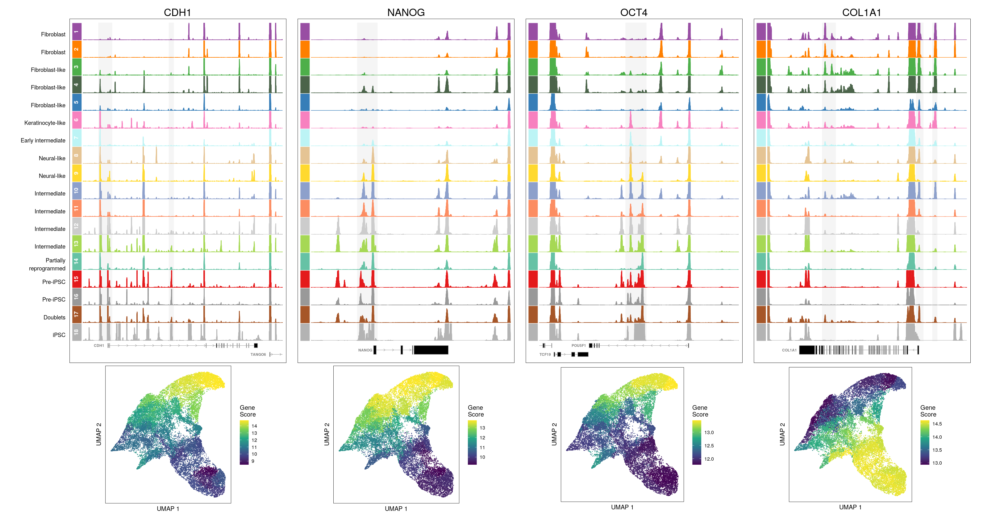

In [267]:
options(repr.plot.width = 27, repr.plot.height = 14)

browser_shots

## Assemble Master

In [369]:
main_fig = wrap_plots(umaps_combined, 
#                       row2_plots,
                      row2_option2_plots,
                      browser_shots, 
                      ncol=1, heights=c(10,8,14))

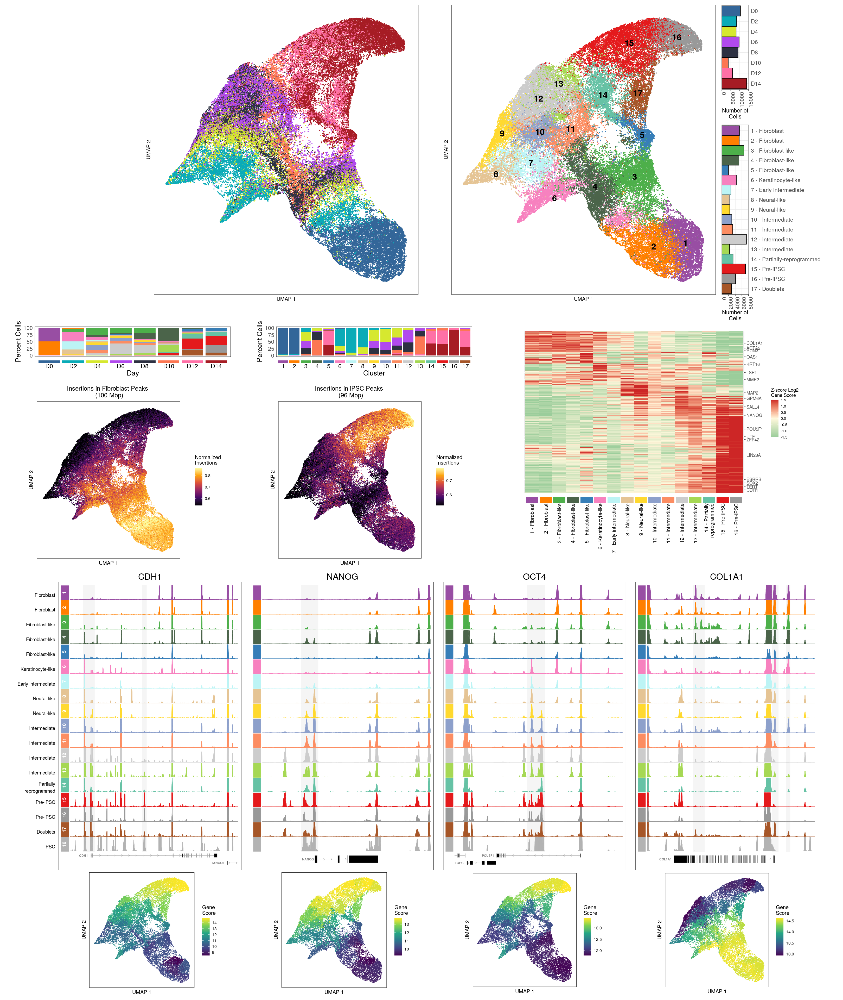

In [370]:
options(repr.plot.width = 27, repr.plot.height = 32)
main_fig